In [27]:
import numpy as np
import xarray as xr 
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cf
import glob
import dask.array as da
import time
import seaborn as sns
import pandas as pd
import matplotlib.path as mpath
# colormaps
import cmaps
from cmcrameri import cm
import cmasher as cmr
import cmocean
import gc

In [207]:
from dask.distributed import Client
client = Client(scheduler_file= '/your_path_to_scheduler/scheduler.json')
client

Connection method: Scheduler file,Scheduler file: /home/huanglei/proj_pyncl/CESM2-LENS/scheduler.json
Dashboard: http://203.247.189.224:8787/status,
Comm: tcp://203.247.189.224:46022,Workers: 0
Dashboard: http://203.247.189.224:8787/status,Total threads: 0
Started: Just now,Total memory: 0 B


# plots in the maintext

In [28]:
ice_ann_climmean_1850s = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_LakeIceCover_EnsembleMean_1850s.nc', decode_times=False).sum('month')
strat_days_1850s_ensmean = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Annual_Total_Stratification_EnsembleMean_1850.nc', decode_times=False)
inverstrat_days_1850s_ensmean = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Annual_Inverse_Stratification_EnsembleMean_1850.nc', decode_times=False)
positstrat_days_1850s_ensmean = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Annual_Summer_Stratification_EnsembleMean_1850.nc', decode_times=False)
overturn_jconv_mon_1850s = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_Overturning_EnsembleMean_1850s.nc', decode_times=False)
tsa_mon_climmean_1850s = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_LandSurfaceAirTemperature_EnsembleMean_1850s.nc', decode_times=False)



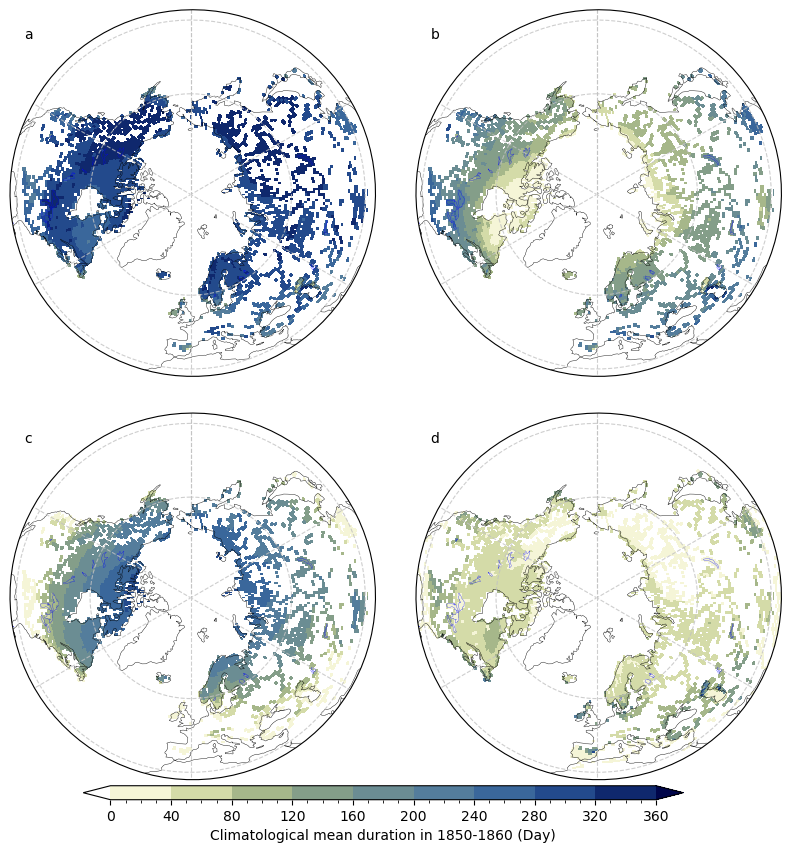

In [29]:

fig, axs = plt.subplots(2,2,
                        figsize = (10,10),
                        subplot_kw={'projection':ccrs.Orthographic(central_latitude = 90)})
plt.subplots_adjust(wspace=0.1, hspace=0.1)
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
[ax.set_extent([-180, 180, 23.5, 90], ccrs.PlateCarree()) for ax in axs.reshape(-1)]
[ax.set_boundary(circle, transform=ax.transAxes) for ax in axs.reshape(-1)]
[ax.coastlines(linewidths = 0.3) for ax in axs.reshape(-1)]
[ax.gridlines(crs = ccrs.PlateCarree(), draw_labels = False, alpha = 0.8, color = '#c2c2c2', linestyle='--', ylocs = (30,60)) for ax in axs.reshape(-1)]
[ax.add_feature(cf.NaturalEarthFeature('physical','lakes','110m'), linewidths=0.2, facecolor='None',edgecolor='Blue') for ax in axs.reshape(-1)]

pl1 = strat_days_1850s_ensmean.where(ice_ann_climmean_1850s > 0).plot(ax = axs.reshape(-1)[0], levels = np.arange(0,366,40), transform=ccrs.PlateCarree(), cmap = cm.davos_r, extend ='both', add_colorbar = False)
pl2 = positstrat_days_1850s_ensmean.where(ice_ann_climmean_1850s > 0).plot(ax = axs.reshape(-1)[1], levels = np.arange(0,366,40), transform = ccrs.PlateCarree(), cmap = cm.davos_r, extend ='both', add_colorbar = False)
pl3 = inverstrat_days_1850s_ensmean.where(ice_ann_climmean_1850s > 0).plot(ax = axs.reshape(-1)[2], levels = np.arange(0,366,40), transform = ccrs.PlateCarree(), cmap = cm.davos_r, extend ='both', add_colorbar = False)
pl4 = overturn_jconv_mon_1850s.where(ice_ann_climmean_1850s > 0).sum('month').where(~np.isnan(strat_days_1850s_ensmean)).plot(ax = axs.reshape(-1)[3], levels = np.arange(0,366,40), transform = ccrs.PlateCarree(), cmap = cm.davos_r, extend ='both', add_colorbar = False)

#----------------------------------------------------------------------------------------------------
cax = fig.add_axes([0.2,0.09,0.6,0.014])
cb    = fig.colorbar(pl4,
                    cax = cax,
                    fraction = 0.06,
                    orientation = 'horizontal',
                    shrink = 0.8,
                    extend   = 'both',
                    aspect   = 40,
                    )
cb.minorticks_on()
cb.set_label('Climatological mean duration in 1850-1860 (Day)')
#----------------------------------------------------------------------------------------------------
[axs.reshape(-1)[i].text(0.04,0.92, ['a' , 'b', 'c', 'd'][i], transform = axs.reshape(-1)[i].transAxes) for i in range(4)]
#----------------------------------------------------------------------------------------------------
plt.savefig('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/Fig_1.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()
plt.close(fig)

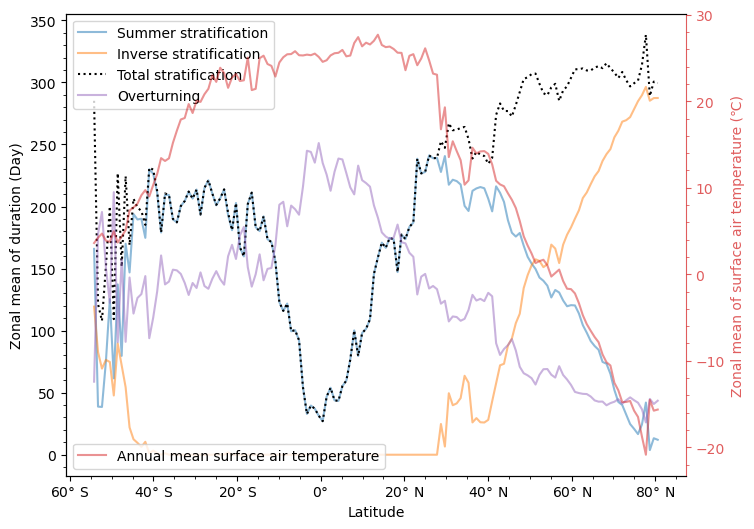

In [35]:
fig, axs = plt.subplots(1,1, figsize = (8,6))
positstrat_days_1850s_ensmean.mean('lon').plot(ax = axs, label = 'Summer stratification', c = 'C0', alpha = 0.5)
inverstrat_days_1850s_ensmean.mean('lon').plot(ax = axs, label = 'Inverse stratification', c = 'C1', alpha = 0.5)
strat_days_1850s_ensmean.mean('lon').plot(ax = axs, ls = 'dotted', label = 'Total stratification', c = 'k')
overturn_jconv_mon_1850s.sum('month', skipna=True, min_count = 4).mean('lon').plot(ax = axs, label = 'Overturning', c = 'C4', alpha = 0.5)
axs.set_ylabel('Zonal mean of duration (Day)')
axs.set_xlabel('Latitude')
axs.minorticks_on()
axs.spines['right'].set_visible(False)
axs.legend(loc = 'upper left')
axs_twinx = axs.twinx()
tsa_mon_climmean_1850s.mean(('month','lon')).plot(ax = axs_twinx, label = 'Annual mean surface air temperature', c = 'C3', alpha = 0.5)
axs_twinx.set_ylabel(u'Zonal mean of surface air temperature (\u2103)')
axs_twinx.minorticks_on()
axs_twinx.legend(loc = 'lower left')
axs_twinx.spines['right'].set_color((0.83921569, 0.15294118, 0.15686275,0.75))
axs_twinx.yaxis.label.set_color((0.83921569, 0.15294118, 0.15686275,0.75))
axs_twinx.tick_params(axis = 'y', which = 'both', colors = (0.83921569, 0.15294118, 0.15686275,0.75))
#----------------------------------------------------------------------------------------------------
# Set up formatter for positive and negative values
def format_fn(tick_val, tick_pos):
    if int(tick_val) > 0:
        return f'{tick_val:.0f}$\degree$ N'
    elif int(tick_val < 0):
        return f'{abs(tick_val):.0f}$\degree$ S'
    else:
        return f'{abs(tick_val):.0f}$\degree$'
#----------------------------------------------------------------------------------------------------
axs.xaxis.set_major_formatter(mpl.ticker.FuncFormatter(format_fn))
#----------------------------------------------------------------------------------------------------
plt.savefig('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/Fig_2.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()
plt.close(fig)

In [37]:
overturn_jconv_days_changes_2029 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_Overturning_EnsembleMean_2029-1850.nc', decode_times=False)
overturn_jconv_days_changes_2067 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_Overturning_EnsembleMean_2067-1850.nc', decode_times=False)
overturn_jconv_days_changes_2096 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_Overturning_EnsembleMean_2096-1850.nc', decode_times=False)

strat_days_changes_2029 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_Total_Stratification_EnsembleMean_2029-1850.nc', decode_times=False)
strat_days_changes_2067 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_Total_Stratification_EnsembleMean_2067-1850.nc', decode_times=False)
strat_days_changes_2096 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_Total_Stratification_EnsembleMean_2096-1850.nc', decode_times=False)

positstrat_days_changes_2029 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_Summer_Stratification_EnsembleMean_2029-1850.nc', decode_times=False)
positstrat_days_changes_2067 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_Summer_Stratification_EnsembleMean_2067-1850.nc', decode_times=False)
positstrat_days_changes_2096 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_Summer_Stratification_EnsembleMean_2096-1850.nc', decode_times=False)

inverstrat_days_changes_2029 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_Inverse_Stratification_EnsembleMean_2029-1850.nc', decode_times=False)
inverstrat_days_changes_2067 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_Inverse_Stratification_EnsembleMean_2067-1850.nc', decode_times=False)
inverstrat_days_changes_2096 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_Inverse_Stratification_EnsembleMean_2096-1850.nc', decode_times=False)

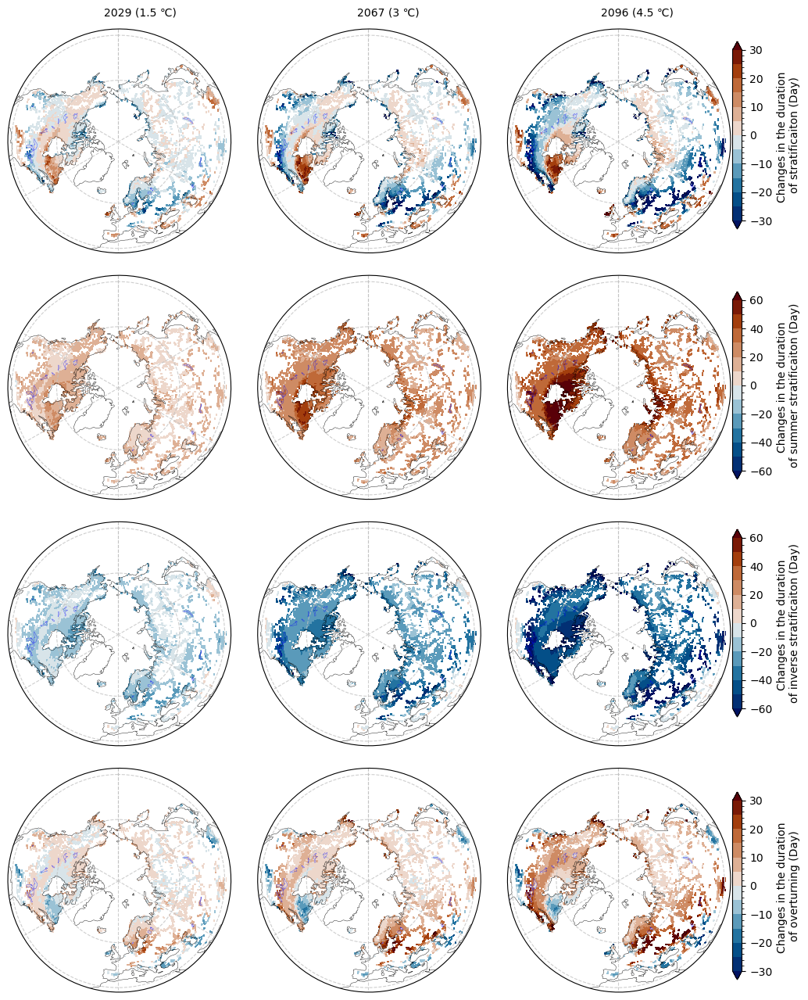

In [78]:
fig, axs = plt.subplots(4,3,
                        figsize = (12,16),
                        subplot_kw={'projection':ccrs.Orthographic(central_latitude = 90)})
plt.subplots_adjust(wspace = 0.1, hspace = 0.1)
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
[ax.set_extent([-180, 180, 23.5, 90], ccrs.PlateCarree()) for ax in axs.reshape(-1)]
[ax.set_boundary(circle, transform=ax.transAxes) for ax in axs.reshape(-1)]
[ax.coastlines(linewidths = 0.3) for ax in axs.reshape(-1)]
[ax.gridlines(crs = ccrs.PlateCarree(), draw_labels = False, alpha = 0.8, color = '#c2c2c2', linestyle='--', ylocs = (30,60)) for ax in axs.reshape(-1)]
[ax.add_feature(cf.NaturalEarthFeature('physical','lakes','110m'), linewidths=0.2, facecolor='None',edgecolor='Blue') for ax in axs.reshape(-1)]
#----------------------------------------------------------------------------------------------------
for i in np.arange(3):
    pl1 = [strat_days_changes_2029, strat_days_changes_2067, strat_days_changes_2096][i].sum('month', skipna=True, min_count=4).where(ice_ann_climmean_1850s > 0).plot(ax = axs[0,i], levels = np.arange(-30,31,5), transform=ccrs.PlateCarree(), cmap = cm.vik, extend ='both', add_colorbar = False)
    pl2 = [positstrat_days_changes_2029, positstrat_days_changes_2067, positstrat_days_changes_2096][i].sum('month', skipna=True, min_count=4).where(ice_ann_climmean_1850s > 0).plot(ax = axs[1,i], levels = np.arange(-60,61,10), transform = ccrs.PlateCarree(), cmap = cm.vik, extend ='both', add_colorbar = False)
    pl3 = [inverstrat_days_changes_2029,inverstrat_days_changes_2067, inverstrat_days_changes_2096][i].sum('month', skipna=True, min_count=4).where(ice_ann_climmean_1850s > 0).plot(ax = axs[2,i], levels = np.arange(-60,61,10), transform = ccrs.PlateCarree(), cmap = cm.vik, extend ='both', add_colorbar = False)
    pl4 = [overturn_jconv_days_changes_2029, overturn_jconv_days_changes_2067, overturn_jconv_days_changes_2096][i].sum('month', skipna=True, min_count=4).where(ice_ann_climmean_1850s > 0).plot(ax = axs[3,i], levels = np.arange(-30,31,5), transform = ccrs.PlateCarree(), cmap = cm.vik, extend ='both', add_colorbar = False)
#----------------------------------------------------------------------------------------------------
for i in range(4):
    cb = fig.colorbar([pl1,pl2,pl3,pl4][i], cax = fig.add_axes([0.9,[0.72, 0.52, 0.33,0.12][i],0.01,0.15]), orientation='vertical', pad = 0.05, extend = 'both', shrink = 0.8)
    cb.set_label('Changes in the duration \nof ' + ['stratificaiton','summer stratificaiton', 'inverse stratificaiton', 'overturning'][i]+' (Day)')
    cb.minorticks_on()
#----------------------------------------------------------------------------------------------------
[fig.text([0.23, 0.5, 0.76][i], 0.89, [u'2029 (1.5 \u2103)', u'2067 (3 \u2103)', u'2096 (4.5 \u2103)'][i]) for i in range(3)]
#----------------------------------------------------------------------------------------------------
plt.savefig('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/Fig_3.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()
plt.close(fig)

In [74]:
u10_mon_diff_icemasked = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_U10_EnsembleMean_2096-1850.nc', decode_times=False)
u10_mon_diff_icemasked = u10_mon_diff_icemasked.assign_coords(
    {'lat': ice_ann_climmean_1850s.lat,
     'lon': ice_ann_climmean_1850s.lon}
)

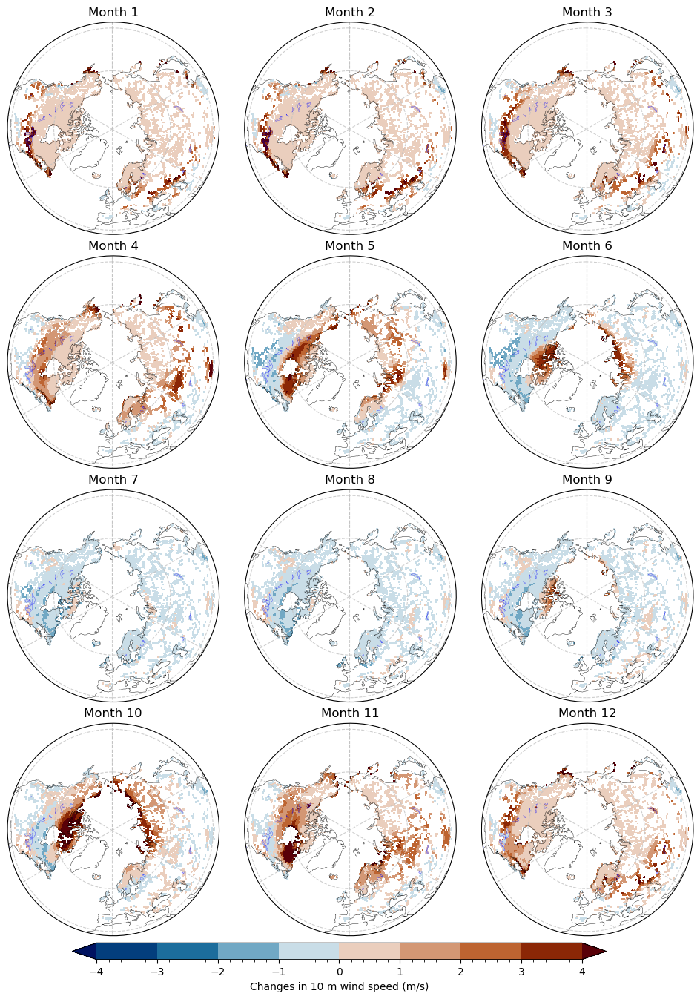

In [79]:
fig, axs = plt.subplots(4,3,
                        figsize = (12,16),
                        subplot_kw={'projection':ccrs.Orthographic(central_latitude = 90)})
plt.subplots_adjust(wspace = 0.1, hspace = 0.1)
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
[ax.set_extent([-180, 180, 23.5, 90], ccrs.PlateCarree()) for ax in axs.reshape(-1)]
[ax.set_boundary(circle, transform=ax.transAxes) for ax in axs.reshape(-1)]
[ax.coastlines(linewidths = 0.3) for ax in axs.reshape(-1)]
[ax.gridlines(crs = ccrs.PlateCarree(), draw_labels = False, alpha = 0.8, color = '#c2c2c2', linestyle='--', ylocs = (30,60)) for ax in axs.reshape(-1)]
[ax.add_feature(cf.NaturalEarthFeature('physical','lakes','110m'), linewidths=0.2, facecolor='None',edgecolor='Blue') for ax in axs.reshape(-1)]
for i in np.arange(4):
    for j in np.arange(3):
        ax = axs[i,j]
        pl = u10_mon_diff_icemasked[i*3+j,:,:].where(ice_ann_climmean_1850s > 0).plot(ax = ax,
                                                levels = np.arange(-4,4.1,1),
                                                transform = ccrs.PlateCarree(),
                                                cmap = cm.vik,
                                                extend = 'both',
                                                add_colorbar = False)
        ax.set_title('Month '+str(i*3+j+1))
#----------------------------------------------------------------------------------------------------
cax = fig.add_axes([0.2,0.09,0.6,0.014])
cb    = fig.colorbar(pl,
                    cax = cax,
                    fraction = 0.06,
                    orientation = 'horizontal',
                    shrink = 0.8,
                    extend   = 'both',
                    aspect   = 40,
                    )
cb.minorticks_on()
cb.set_label('Changes in 10 m wind speed (m/s)')
#----------------------------------------------------------------------------------------------------
plt.savefig('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/Fig_4.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()
plt.close(fig)

In [82]:
positstrat_end_changes_2029 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/End_Summer_Stratification_EnsembleMean_2029-1850.nc', decode_times = False)
positstrat_end_changes_2067 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/End_Summer_Stratification_EnsembleMean_2067-1850.nc', decode_times = False)
positstrat_end_changes_2096 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/End_Summer_Stratification_EnsembleMean_2096-1850.nc', decode_times = False)
positstrat_start_changes_2029 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Start_Summer_Stratification_EnsembleMean_2029-1850.nc', decode_times = False)
positstrat_start_changes_2067 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Start_Summer_Stratification_EnsembleMean_2067-1850.nc', decode_times = False)
positstrat_start_changes_2096 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Start_Summer_Stratification_EnsembleMean_2096-1850.nc', decode_times = False)

inverstrat_end_changes_2029 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/End_Inverse_Stratification_EnsembleMean_2029-1850.nc', decode_times = False)
inverstrat_end_changes_2067 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/End_Inverse_Stratification_EnsembleMean_2067-1850.nc', decode_times = False)
inverstrat_end_changes_2096 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/End_Inverse_Stratification_EnsembleMean_2096-1850.nc', decode_times = False)
inverstrat_start_changes_2029 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Start_Inverse_Stratification_EnsembleMean_2029-1850.nc', decode_times = False)
inverstrat_start_changes_2067 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Start_Inverse_Stratification_EnsembleMean_2067-1850.nc', decode_times = False)
inverstrat_start_changes_2096 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Start_Inverse_Stratification_EnsembleMean_2096-1850.nc', decode_times = False)

overturn_spring_duration_changes_2029 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Spring_Overturning_EnsembleMean_2029-1850.nc', decode_times = False)
overturn_spring_duration_changes_2067 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Spring_Overturning_EnsembleMean_2067-1850.nc', decode_times = False)
overturn_spring_duration_changes_2096 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Spring_Overturning_EnsembleMean_2096-1850.nc', decode_times = False)
overturn_winter_duration_changes_2029 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Winter_Overturning_EnsembleMean_2029-1850.nc', decode_times = False)
overturn_winter_duration_changes_2067 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Winter_Overturning_EnsembleMean_2067-1850.nc', decode_times = False)
overturn_winter_duration_changes_2096 = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Winter_Overturning_EnsembleMean_2096-1850.nc', decode_times = False)

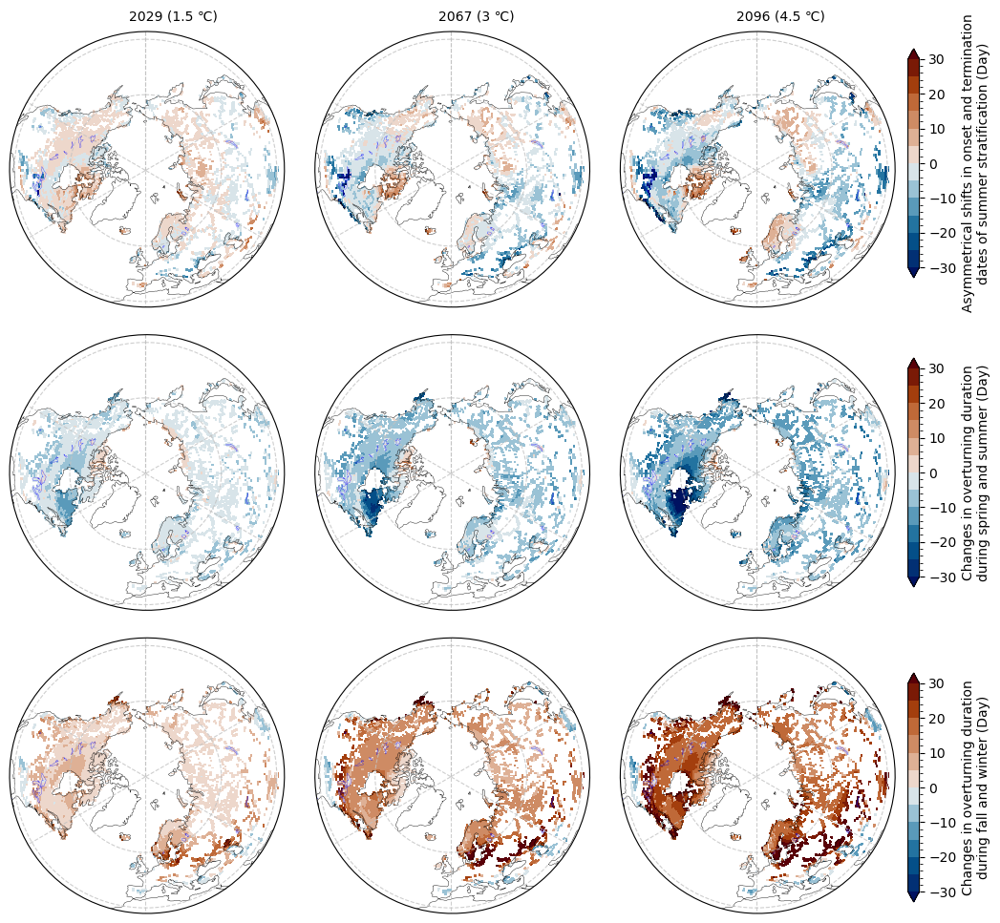

In [83]:
fig, axs = plt.subplots(3,3,
                        figsize = (12,12),
                        subplot_kw={'projection':ccrs.Orthographic(central_latitude = 90)})
plt.subplots_adjust(wspace = 0.1, hspace = 0.1)
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
[ax.set_extent([-180, 180, 23.5, 90], ccrs.PlateCarree()) for ax in axs.reshape(-1)]
[ax.set_boundary(circle, transform=ax.transAxes) for ax in axs.reshape(-1)]
[ax.coastlines(linewidths = 0.3) for ax in axs.reshape(-1)]
[ax.gridlines(crs = ccrs.PlateCarree(), draw_labels = False, alpha = 0.8, color = '#c2c2c2', linestyle='--', ylocs = (30,60)) for ax in axs.reshape(-1)]
[ax.add_feature(cf.NaturalEarthFeature('physical','lakes','110m'), linewidths=0.2, facecolor='None',edgecolor='Blue') for ax in axs.reshape(-1)]
#----------------------------------------------------------------------------------------------------
for i in np.arange(3):
    pl1 = [positstrat_end_changes_2029 + positstrat_start_changes_2029, 
        positstrat_end_changes_2067 + positstrat_start_changes_2067, 
        positstrat_end_changes_2096 + positstrat_start_changes_2096][i].plot(ax = axs[0,i], levels = np.arange(-30,31,5), transform=ccrs.PlateCarree(), cmap = cm.vik, extend ='both', add_colorbar = False)
    pl2 = [overturn_spring_duration_changes_2029, overturn_spring_duration_changes_2067, overturn_spring_duration_changes_2096][i].plot(ax = axs[1,i], levels = np.arange(-30,31,5), transform=ccrs.PlateCarree(), cmap = cm.vik, extend ='both', add_colorbar = False)
    pl3 =[overturn_winter_duration_changes_2029, overturn_winter_duration_changes_2067, overturn_winter_duration_changes_2096][i].plot(ax = axs[2,i], levels = np.arange(-30,31,5), transform = ccrs.PlateCarree(), cmap = cm.vik, extend ='both', add_colorbar = False)
#----------------------------------------------------------------------------------------------------
for i in range(3):
    cb = fig.colorbar([pl1,pl2, pl3][i], cax = fig.add_axes([0.91,[0.665, 0.395, 0.12][i],0.01,0.2]), orientation='vertical', pad = 0.05, extend = 'both', shrink = 0.8)
    cb.set_label(['Asymmetrical shifts in onset and termination\ndates of summer stratification',
                'Changes in overturning duration\nduring spring and summer',
                'Changes in overturning duration\nduring fall and winter'][i]+' (Day)')
    cb.minorticks_on()
#----------------------------------------------------------------------------------------------------
[fig.text([0.23, 0.5, 0.76][i], 0.89, [u'2029 (1.5 \u2103)', u'2067 (3 \u2103)', u'2096 (4.5 \u2103)'][i]) for i in range(3)]
#----------------------------------------------------------------------------------------------------
plt.savefig('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/Fig_5.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()
plt.close(fig)

# plots in Supplementary Material

Figure S4

In [ ]:
overturn_jconv_days_mon_1850s = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_Overturning_EnsembleMean_1850s.nc', decode_times=False)

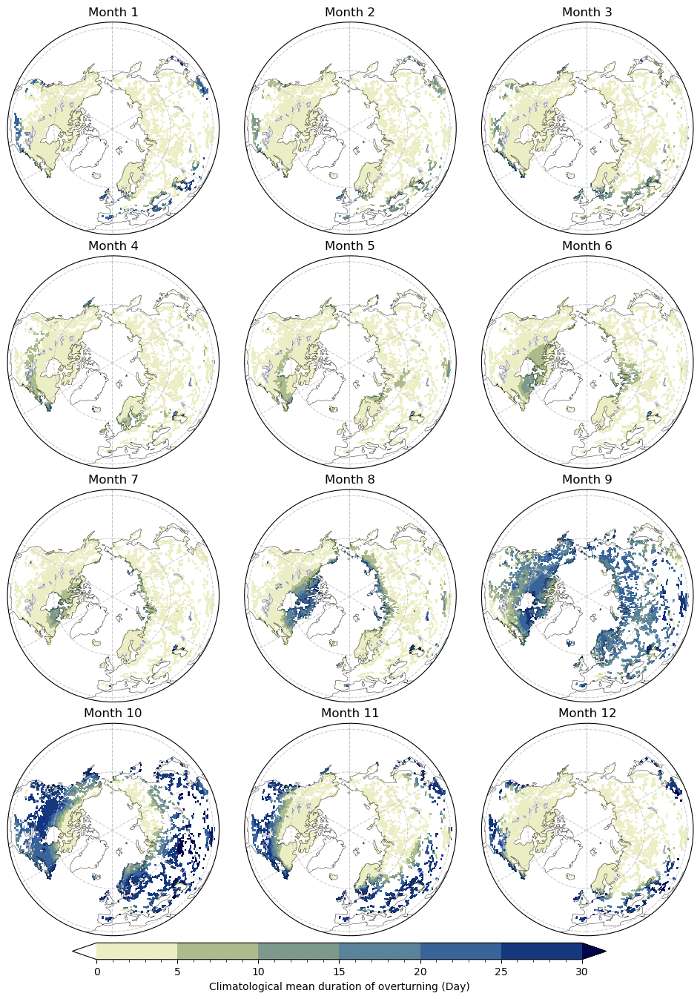

In [ ]:
fig, axs = plt.subplots(4,3,
                        figsize = (12,16),
                        subplot_kw={'projection':ccrs.Orthographic(central_latitude = 90)})
plt.subplots_adjust(wspace = 0.1, hspace = 0.1)
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
[ax.set_extent([-180, 180, 23.5, 90], ccrs.PlateCarree()) for ax in axs.reshape(-1)]
[ax.set_boundary(circle, transform=ax.transAxes) for ax in axs.reshape(-1)]
[ax.coastlines(linewidths = 0.3) for ax in axs.reshape(-1)]
[ax.gridlines(crs = ccrs.PlateCarree(), draw_labels = False, alpha = 0.8, color = '#c2c2c2', linestyle='--', ylocs = (30,60)) for ax in axs.reshape(-1)]
[ax.add_feature(cf.NaturalEarthFeature('physical','lakes','110m'), linewidths=0.2, facecolor='None',edgecolor='Blue') for ax in axs.reshape(-1)]
for i in np.arange(4):
    for j in np.arange(3):
        ax = axs[i,j]
        pl = overturn_jconv_days_mon_1850s[i*3+j,:,:].where(ice_ann_climmean_1850s > 0).plot(ax = ax,
                                                levels = np.arange(0,31,5),
                                                transform = ccrs.PlateCarree(),
                                                cmap = cm.davos_r,
                                                extend = 'both',
                                                add_colorbar = False)
        ax.set_title('Month '+str(i*3+j+1))
#----------------------------------------------------------------------------------------------------
cax = fig.add_axes([0.2,0.09,0.6,0.014])
cb    = fig.colorbar(pl,
                    cax = cax,
                    fraction = 0.06,
                    orientation = 'horizontal',
                    shrink = 0.8,
                    extend   = 'both',
                    aspect   = 40,
                    )
cb.minorticks_on()
cb.set_label('Climatological mean duration of overturning (Day)')
#----------------------------------------------------------------------------------------------------
plt.show()

Figure S5

In [ ]:
inverstrat_days_1850s_mon_ensmean = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_Inverse_Stratification_EnsembleMean_1850s.nc', decode_times=False)

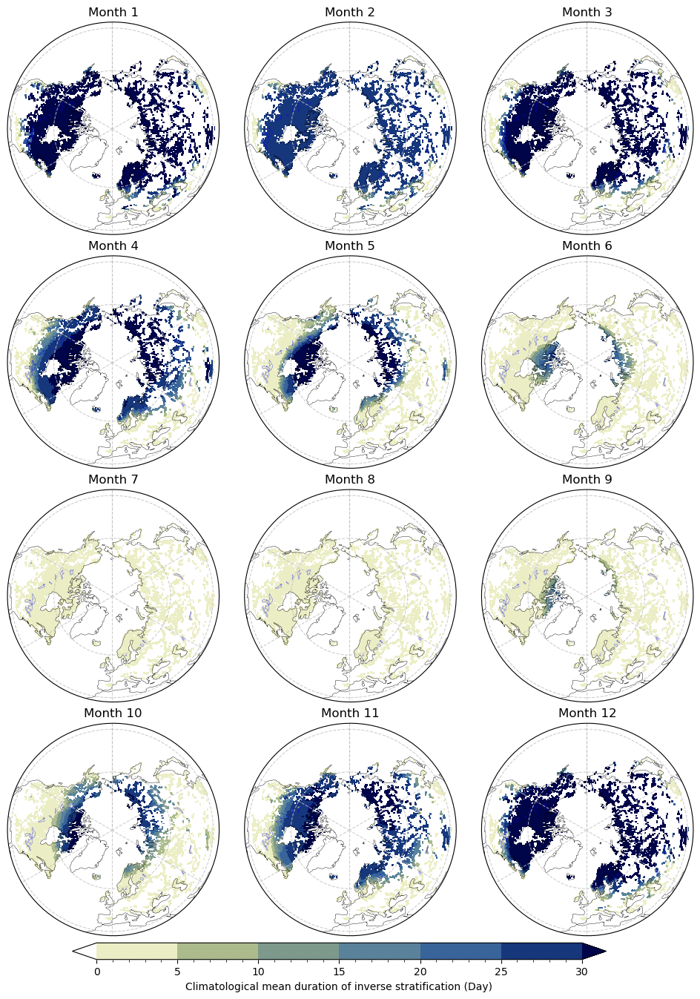

In [ ]:
fig, axs = plt.subplots(4,3,
                        figsize = (12,16),
                        subplot_kw={'projection':ccrs.Orthographic(central_latitude = 90)})
plt.subplots_adjust(wspace = 0.1, hspace = 0.1)
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
[ax.set_extent([-180, 180, 23.5, 90], ccrs.PlateCarree()) for ax in axs.reshape(-1)]
[ax.set_boundary(circle, transform=ax.transAxes) for ax in axs.reshape(-1)]
[ax.coastlines(linewidths = 0.3) for ax in axs.reshape(-1)]
[ax.gridlines(crs = ccrs.PlateCarree(), draw_labels = False, alpha = 0.8, color = '#c2c2c2', linestyle='--', ylocs = (30,60)) for ax in axs.reshape(-1)]
[ax.add_feature(cf.NaturalEarthFeature('physical','lakes','110m'), linewidths=0.2, facecolor='None',edgecolor='Blue') for ax in axs.reshape(-1)]
for i in np.arange(4):
    for j in np.arange(3):
        ax = axs[i,j]
        pl = inverstrat_days_1850s_mon_ensmean[i*3+j,:,:].where(ice_ann_climmean_1850s > 0).plot(ax = ax,
                                                levels = np.arange(0,31,5),
                                                transform = ccrs.PlateCarree(),
                                                cmap = cm.davos_r,
                                                extend = 'both',
                                                add_colorbar = False)
        ax.set_title('Month '+str(i*3+j+1))
#----------------------------------------------------------------------------------------------------
cax = fig.add_axes([0.2,0.09,0.6,0.014])
cb    = fig.colorbar(pl,
                    cax = cax,
                    fraction = 0.06,
                    orientation = 'horizontal',
                    shrink = 0.8,
                    extend   = 'both',
                    aspect   = 40,
                    )
cb.minorticks_on()
cb.set_label('Climatological mean duration of inverse stratification (Day)')
#----------------------------------------------------------------------------------------------------
plt.show()

Figure S6

In [ ]:
ice_mon_climmean_1850s = xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_LakeIceCover_EnsembleMean_1850s.nc', decode_times=False)
ice_mon_climmean_1850s = ice_mon_climmean_1850s.where(~np.isnan(overturn_jconv_days_mon_1850s[0,...].drop('month')))

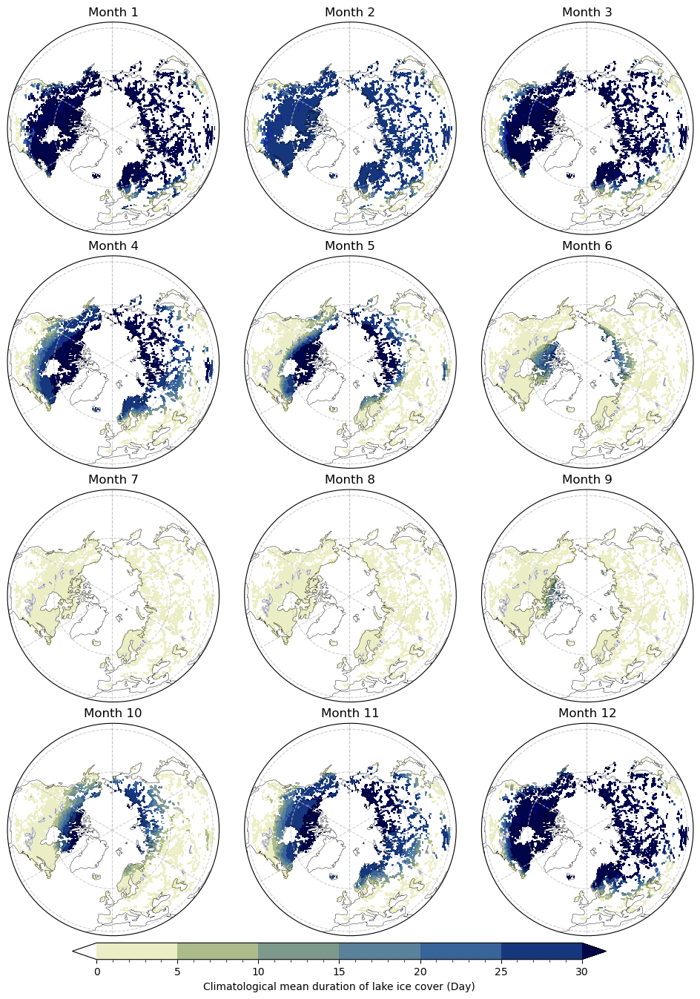

In [ ]:
fig, axs = plt.subplots(4,3,
                        figsize = (12,16),
                        subplot_kw={'projection':ccrs.Orthographic(central_latitude = 90)})
plt.subplots_adjust(wspace = 0.1, hspace = 0.1)
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
[ax.set_extent([-180, 180, 23.5, 90], ccrs.PlateCarree()) for ax in axs.reshape(-1)]
[ax.set_boundary(circle, transform=ax.transAxes) for ax in axs.reshape(-1)]
[ax.coastlines(linewidths = 0.3) for ax in axs.reshape(-1)]
[ax.gridlines(crs = ccrs.PlateCarree(), draw_labels = False, alpha = 0.8, color = '#c2c2c2', linestyle='--', ylocs = (30,60)) for ax in axs.reshape(-1)]
[ax.add_feature(cf.NaturalEarthFeature('physical','lakes','110m'), linewidths=0.2, facecolor='None',edgecolor='Blue') for ax in axs.reshape(-1)]
for i in np.arange(4):
    for j in np.arange(3):
        ax = axs[i,j]
        pl = ice_mon_climmean_1850s[i*3+j,:,:].where(ice_ann_climmean_1850s > 0).plot(ax = ax,
                                                levels = np.arange(0,31,5),
                                                transform = ccrs.PlateCarree(),
                                                cmap = cm.davos_r,
                                                extend = 'both',
                                                add_colorbar = False)
        ax.set_title('Month '+str(i*3+j+1))
#----------------------------------------------------------------------------------------------------
cax = fig.add_axes([0.2,0.09,0.6,0.014])
cb    = fig.colorbar(pl,
                    cax = cax,
                    fraction = 0.06,
                    orientation = 'horizontal',
                    shrink = 0.8,
                    extend   = 'both',
                    aspect   = 40,
                    )
cb.minorticks_on()
cb.set_label('Climatological mean duration of lake ice cover (Day)')
#----------------------------------------------------------------------------------------------------
plt.show()

Figure S7

In [ ]:
ice_days_changes =xr.open_dataarray('/proj/lhuang/scripts/CESM2-LENS/Lake_Mixing_phenology/data_for_open/Monthly_LakeIceCover_EnsembleMean_2096-1850.nc', decode_times=False)

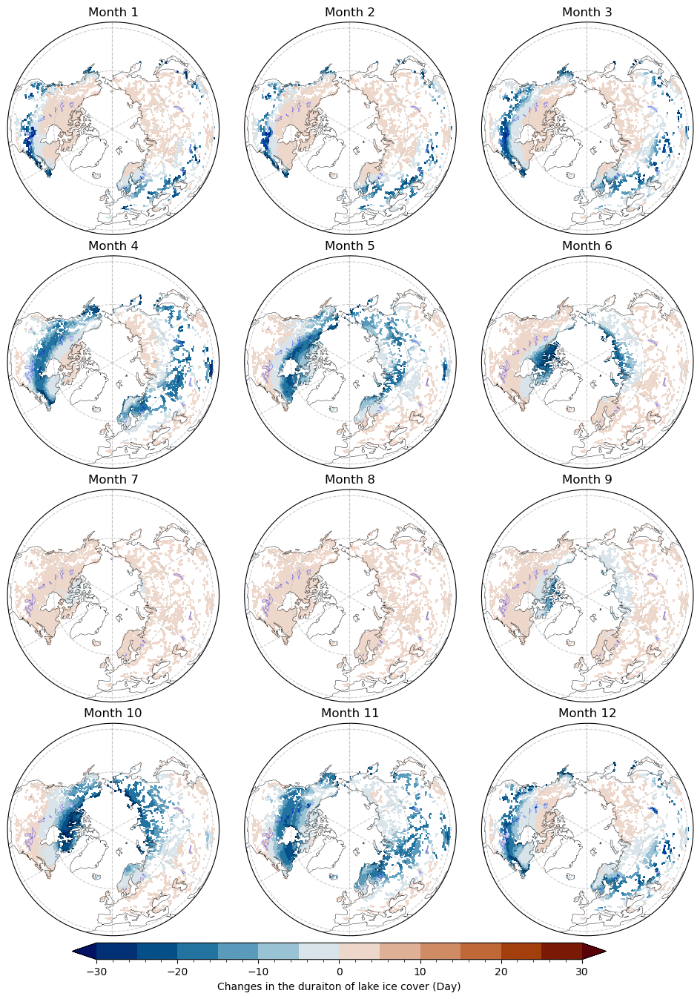

In [ ]:
fig, axs = plt.subplots(4,3,
                        figsize = (12,16),
                        subplot_kw={'projection':ccrs.Orthographic(central_latitude = 90)})
plt.subplots_adjust(wspace = 0.1, hspace = 0.1)
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
[ax.set_extent([-180, 180, 23.5, 90], ccrs.PlateCarree()) for ax in axs.reshape(-1)]
[ax.set_boundary(circle, transform=ax.transAxes) for ax in axs.reshape(-1)]
[ax.coastlines(linewidths = 0.3) for ax in axs.reshape(-1)]
[ax.gridlines(crs = ccrs.PlateCarree(), draw_labels = False, alpha = 0.8, color = '#c2c2c2', linestyle='--', ylocs = (30,60)) for ax in axs.reshape(-1)]
[ax.add_feature(cf.NaturalEarthFeature('physical','lakes','110m'), linewidths=0.2, facecolor='None',edgecolor='Blue') for ax in axs.reshape(-1)]
for i in np.arange(4):
    for j in np.arange(3):
        ax = axs[i,j]
        pl = ice_days_changes[i*3+j,:,:].where(ice_ann_climmean_1850s > 0).plot(ax = ax,
                                                levels = np.arange(-30,31,5),
                                                transform = ccrs.PlateCarree(),
                                                cmap = cm.vik,
                                                extend = 'both',
                                                add_colorbar = False)
        ax.set_title('Month '+str(i*3+j+1))
#----------------------------------------------------------------------------------------------------
cax = fig.add_axes([0.2,0.09,0.6,0.014])
cb    = fig.colorbar(pl,
                    cax = cax,
                    fraction = 0.06,
                    orientation = 'horizontal',
                    shrink = 0.8,
                    extend   = 'both',
                    aspect   = 40,
                    )
cb.minorticks_on()
cb.set_label('Changes in the duraiton of lake ice cover (Day)')
#----------------------------------------------------------------------------------------------------
plt.show()

Figure S8

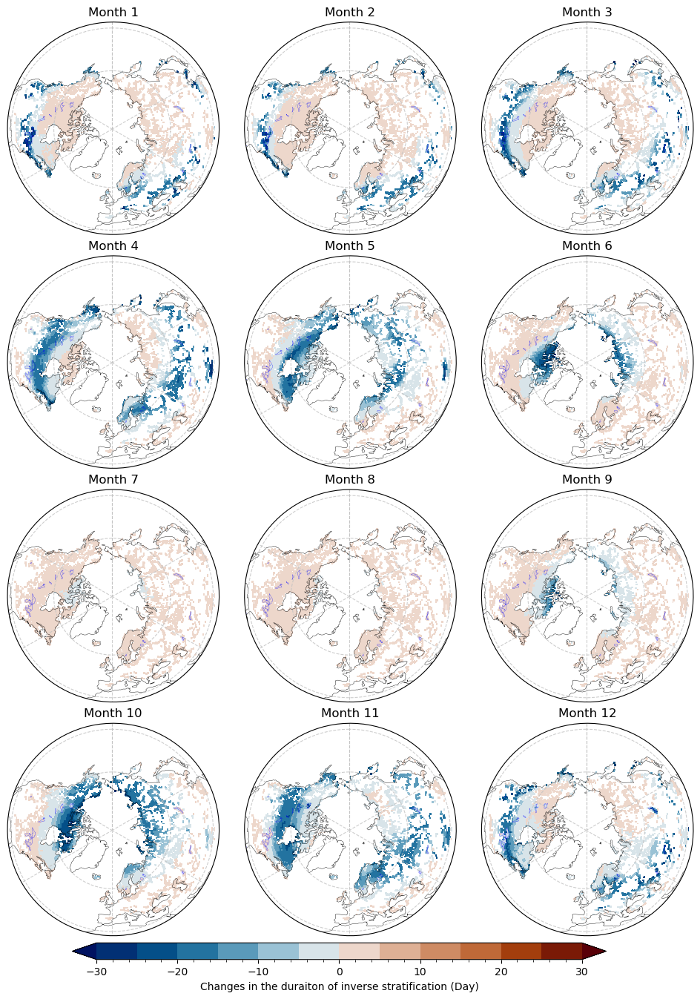

In [ ]:
fig, axs = plt.subplots(4,3,
                        figsize = (12,16),
                        subplot_kw={'projection':ccrs.Orthographic(central_latitude = 90)})
plt.subplots_adjust(wspace = 0.1, hspace = 0.1)
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
[ax.set_extent([-180, 180, 23.5, 90], ccrs.PlateCarree()) for ax in axs.reshape(-1)]
[ax.set_boundary(circle, transform=ax.transAxes) for ax in axs.reshape(-1)]
[ax.coastlines(linewidths = 0.3) for ax in axs.reshape(-1)]
[ax.gridlines(crs = ccrs.PlateCarree(), draw_labels = False, alpha = 0.8, color = '#c2c2c2', linestyle='--', ylocs = (30,60)) for ax in axs.reshape(-1)]
[ax.add_feature(cf.NaturalEarthFeature('physical','lakes','110m'), linewidths=0.2, facecolor='None',edgecolor='Blue') for ax in axs.reshape(-1)]
for i in np.arange(4):
    for j in np.arange(3):
        ax = axs[i,j]
        pl = inverstrat_days_changes_2096[i*3+j,:,:].where(ice_ann_climmean_1850s > 0).plot(ax = ax,
                                                levels = np.arange(-30,31,5),
                                                transform = ccrs.PlateCarree(),
                                                cmap = cm.vik,
                                                extend = 'both',
                                                add_colorbar = False)
        ax.set_title('Month '+str(i*3+j+1))
#----------------------------------------------------------------------------------------------------
cax = fig.add_axes([0.2,0.09,0.6,0.014])
cb    = fig.colorbar(pl,
                    cax = cax,
                    fraction = 0.06,
                    orientation = 'horizontal',
                    shrink = 0.8,
                    extend   = 'both',
                    aspect   = 40,
                    )
cb.minorticks_on()
cb.set_label('Changes in the duraiton of inverse stratification (Day)')
#----------------------------------------------------------------------------------------------------
plt.show()

Figure S9

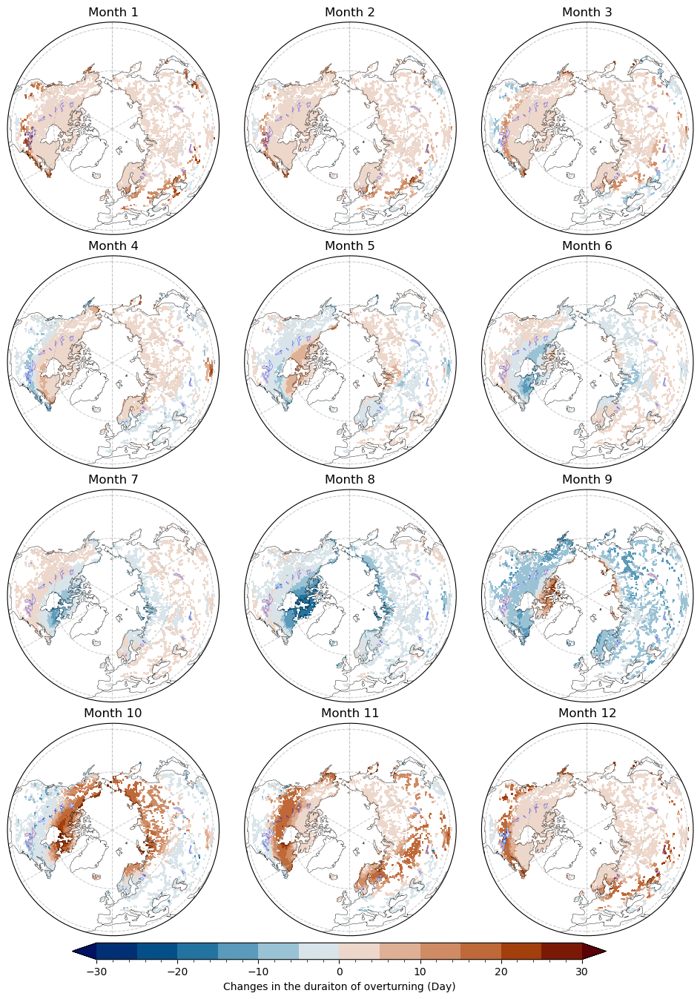

In [ ]:
fig, axs = plt.subplots(4,3,
                        figsize = (12,16),
                        subplot_kw={'projection':ccrs.Orthographic(central_latitude = 90)})
plt.subplots_adjust(wspace = 0.1, hspace = 0.1)
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
[ax.set_extent([-180, 180, 23.5, 90], ccrs.PlateCarree()) for ax in axs.reshape(-1)]
[ax.set_boundary(circle, transform=ax.transAxes) for ax in axs.reshape(-1)]
[ax.coastlines(linewidths = 0.3) for ax in axs.reshape(-1)]
[ax.gridlines(crs = ccrs.PlateCarree(), draw_labels = False, alpha = 0.8, color = '#c2c2c2', linestyle='--', ylocs = (30,60)) for ax in axs.reshape(-1)]
[ax.add_feature(cf.NaturalEarthFeature('physical','lakes','110m'), linewidths=0.2, facecolor='None',edgecolor='Blue') for ax in axs.reshape(-1)]
for i in np.arange(4):
    for j in np.arange(3):
        ax = axs[i,j]
        pl = overturn_jconv_days_changes_2096[i*3+j,:,:].where(ice_ann_climmean_1850s > 0).plot(ax = ax,
                                                levels = np.arange(-30,31,5),
                                                transform = ccrs.PlateCarree(),
                                                cmap = cm.vik,
                                                extend = 'both',
                                                add_colorbar = False)
        ax.set_title('Month '+str(i*3+j+1))
#----------------------------------------------------------------------------------------------------
cax = fig.add_axes([0.2,0.09,0.6,0.014])
cb    = fig.colorbar(pl,
                    cax = cax,
                    fraction = 0.06,
                    orientation = 'horizontal',
                    shrink = 0.8,
                    extend   = 'both',
                    aspect   = 40,
                    )
cb.minorticks_on()
cb.set_label('Changes in the duraiton of overturning (Day)')
#----------------------------------------------------------------------------------------------------
plt.show()

Figure S11

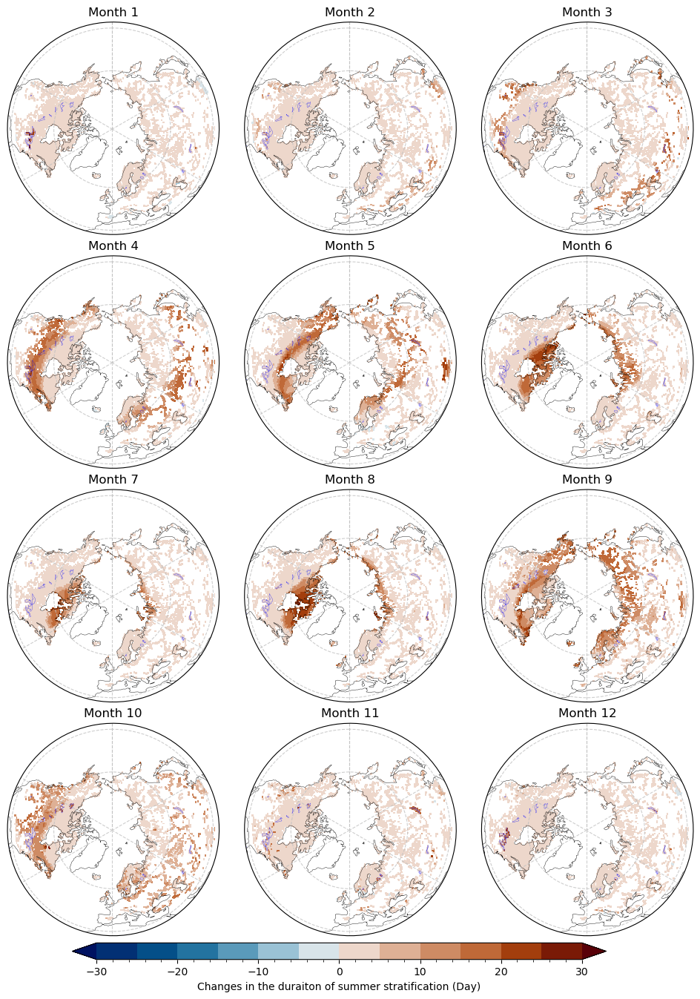

In [ ]:
fig, axs = plt.subplots(4,3,
                        figsize = (12,16),
                        subplot_kw={'projection':ccrs.Orthographic(central_latitude = 90)})
plt.subplots_adjust(wspace = 0.1, hspace = 0.1)
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
[ax.set_extent([-180, 180, 23.5, 90], ccrs.PlateCarree()) for ax in axs.reshape(-1)]
[ax.set_boundary(circle, transform=ax.transAxes) for ax in axs.reshape(-1)]
[ax.coastlines(linewidths = 0.3) for ax in axs.reshape(-1)]
[ax.gridlines(crs = ccrs.PlateCarree(), draw_labels = False, alpha = 0.8, color = '#c2c2c2', linestyle='--', ylocs = (30,60)) for ax in axs.reshape(-1)]
[ax.add_feature(cf.NaturalEarthFeature('physical','lakes','110m'), linewidths=0.2, facecolor='None',edgecolor='Blue') for ax in axs.reshape(-1)]
for i in np.arange(4):
    for j in np.arange(3):
        ax = axs[i,j]
        pl = positstrat_days_changes_2096[i*3+j,:,:].where(ice_ann_climmean_1850s > 0).plot(ax = ax,
                                                levels = np.arange(-30,31,5),
                                                transform = ccrs.PlateCarree(),
                                                cmap = cm.vik,
                                                extend = 'both',
                                                add_colorbar = False)
        ax.set_title('Month '+str(i*3+j+1))
#----------------------------------------------------------------------------------------------------
cax = fig.add_axes([0.2,0.09,0.6,0.014])
cb    = fig.colorbar(pl,
                    cax = cax,
                    fraction = 0.06,
                    orientation = 'horizontal',
                    shrink = 0.8,
                    extend   = 'both',
                    aspect   = 40,
                    )
cb.minorticks_on()
cb.set_label('Changes in the duraiton of summer stratification (Day)')
#----------------------------------------------------------------------------------------------------
plt.show()

Figure S12

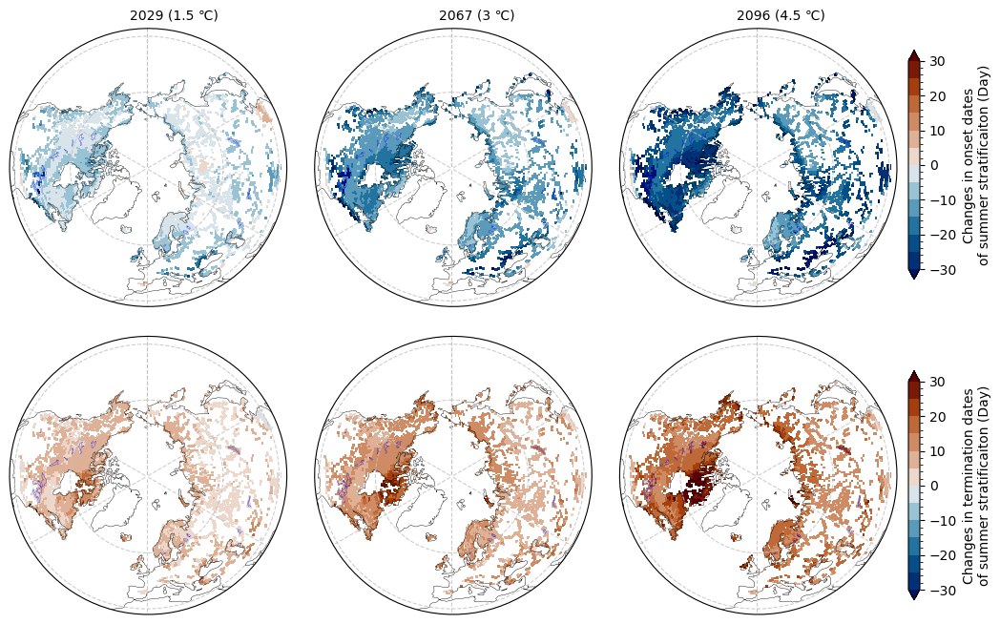

In [ ]:
fig, axs = plt.subplots(2,3,
                        figsize = (12,8),
                        subplot_kw={'projection':ccrs.Orthographic(central_latitude = 90)})
plt.subplots_adjust(wspace = 0.1, hspace = 0.1)
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
[ax.set_extent([-180, 180, 23.5, 90], ccrs.PlateCarree()) for ax in axs.reshape(-1)]
[ax.set_boundary(circle, transform=ax.transAxes) for ax in axs.reshape(-1)]
[ax.coastlines(linewidths = 0.3) for ax in axs.reshape(-1)]
[ax.gridlines(crs = ccrs.PlateCarree(), draw_labels = False, alpha = 0.8, color = '#c2c2c2', linestyle='--', ylocs = (30,60)) for ax in axs.reshape(-1)]
[ax.add_feature(cf.NaturalEarthFeature('physical','lakes','110m'), linewidths=0.2, facecolor='None',edgecolor='Blue') for ax in axs.reshape(-1)]
#----------------------------------------------------------------------------------------------------
for i in np.arange(3):
    pl1 = [positstrat_start_changes_2029, positstrat_start_changes_2067, positstrat_start_changes_2096][i].plot(ax = axs[0,i], levels = np.arange(-30,31,5), transform=ccrs.PlateCarree(), cmap = cm.vik, extend ='both', add_colorbar = False)
    pl2 = [positstrat_end_changes_2029, positstrat_end_changes_2067, positstrat_end_changes_2096][i].plot(ax = axs[1,i], levels = np.arange(-30,31,5), transform = ccrs.PlateCarree(), cmap = cm.vik, extend ='both', add_colorbar = False)
    #pl3 = [inverstrat_start_changes_2029,inverstrat_start_changes_2067, inverstrat_start_changes_2096][i].plot(ax = axs[2,i], levels = np.arange(-30,31,5), transform = ccrs.PlateCarree(), cmap = cm.vik, extend ='both', add_colorbar = False)
    #pl4 = [inverstrat_end_changes_2029,inverstrat_end_changes_2067, inverstrat_end_changes_2096][i].plot(ax = axs[3,i], levels = np.arange(-30,31,5), transform = ccrs.PlateCarree(), cmap = cm.vik, extend ='both', add_colorbar = False)
#----------------------------------------------------------------------------------------------------
for i in range(2):
    cb = fig.colorbar([pl1,pl2][i], cax = fig.add_axes([0.91,[0.55, 0.13][i],0.01,0.3]), orientation='vertical', pad = 0.05, extend = 'both', shrink = 0.8)
    cb.set_label('Changes in ' + ['onset dates\nof summer stratificaiton','termination dates\nof summer stratificaiton'][i]+' (Day)')
    cb.minorticks_on()
#----------------------------------------------------------------------------------------------------
[fig.text([0.23, 0.5, 0.76][i], 0.89, [u'2029 (1.5 \u2103)', u'2067 (3 \u2103)', u'2096 (4.5 \u2103)'][i]) for i in range(3)]
#----------------------------------------------------------------------------------------------------
plt.show()